# Ffx. Connector GTFS Analysis
The follow analysis will demonstrate merge/join operations and time series analyses to gain insights about the Fairfax Connector Bus Service

The first step is to read in all the text files as dataframes and inspect their contents -

In [160]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

agency = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\agency.txt')
calendar = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\calendar.txt')
calendar_dates = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\calendar_dates.txt')
fare_attributes = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\fare_attributes.txt')
frequencies = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\frequencies.txt')
routes = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\routes.txt')
shapes = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\shapes.txt')
stop_times = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\stop_times.txt')
stops = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\stops.txt')
timepoint_times = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\timepoint_times.txt')
timepoints = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\timepoints.txt')
trips = pd.read_csv(r'C:\Users\hameed\Desktop\Datasets\connector_gtfs\trips.txt')


In [161]:
alldfs = ['agency','calendar', 'calendar_dates', 'fare_attributes', 'frequencies', 'routes',
          'shapes', 'stop_times', 'stops', 'timepoint_times', 'timepoints', 'trips']
func = lambda x: display(globals()[x].head())
for name in alldfs:
    print(name + ' table')
    func(name)


agency table


,agency_id,agency_name,agency_url,agency_timezone,agency_lang,agency_phone,agency_fare_url,agency_email
0,1,Fairfax Connector,http://www.fairfaxcounty.gov/connector/routes/,US/Eastern,en,703-339-7200,NaN,NaN


calendar table


,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,1,0,0,0,0,0,0,1,20210710,20220731
1,2,1,1,1,1,1,0,0,20210710,20220731
2,3,0,0,0,0,0,1,0,20210710,20220731
3,4,0,0,0,0,0,0,0,20210710,20220731


calendar_dates table


,service_id,date,exception_type
0,1,20211125,1
1,1,20211225,1
2,1,20220101,1
3,1,20210906,1
4,1,20220530,1


fare_attributes table


,fare_id,price,currency_type,payment_method,transfers,transfer_duration


frequencies table


,trip_id,start_time,end_time,headway_secs,exact_times


routes table


,route_id,agency_id,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color
0,101,1,101,Fort Hunt - Mount Vernon,NaN,3,NaN,00ffff,ffffff
1,109,1,109,Rose Hill,NaN,3,NaN,00ff00,000000
2,151,1,151,Engleside - Mt Vernon,NaN,3,NaN,00ffff,000000
3,152,1,152,Groveton - Mt Vernon,NaN,3,NaN,00ffff,ffffff
4,159,1,159,Engleside Limited-Stop,NaN,3,NaN,00ffff,ffffff


shapes table


,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
0,shp-101-01,38.71125,-77.08723,1,0.00
1,shp-101-01,38.71129,-77.08720,2,5.15
2,shp-101-01,38.71126,-77.08713,3,12.08
3,shp-101-01,38.71121,-77.08701,4,23.88
4,shp-101-01,38.71115,-77.08693,5,33.51


stop_times table


,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,1020,16:13:00,16:13:00,56,1,NaN,0,0,0.00,1
1,1020,16:14:38,16:14:38,1141,2,NaN,0,0,466.79,0
2,1020,16:15:23,16:15:23,1142,3,NaN,0,0,676.95,0
3,1020,16:16:15,16:16:15,1139,4,NaN,0,0,869.53,0
4,1020,16:16:57,16:16:57,1145,5,NaN,0,0,1102.58,0


stops table


,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,stop_timezone,wheelchair_boarding
0,3245,6552,Park St and McHenry St,NaN,38.891683,-77.248563,NaN,NaN,NaN,NaN,NaN,1
1,3246,6553,Lee Hwy and Eskirdge Rd (EB),NaN,38.873912,-77.231425,NaN,NaN,NaN,NaN,NaN,1
2,3247,6554,Lee Highway and Merrilee Dr,NaN,38.874153,-77.231529,NaN,NaN,NaN,NaN,NaN,1
3,3248,6555,Park St and Mchenry St,NaN,38.891647,-77.248377,NaN,NaN,NaN,NaN,NaN,1
4,3249,6556,Park St and Adahi Rd,NaN,38.893318,-77.249593,NaN,NaN,NaN,NaN,NaN,1


timepoint_times table


,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,1020,16:13:00,16:13:00,56,1,NaN,0,0,0.00,0
1,1020,16:13:00,16:13:00,MHUS,2,NaN,1,1,NaN,1
2,1020,16:14:38,16:14:38,1141,3,NaN,0,0,466.79,0
3,1020,16:15:23,16:15:23,1142,4,NaN,0,0,676.95,0
4,1020,16:16:15,16:16:15,1139,5,NaN,0,0,869.53,0


timepoints table


,timepoint_id,timepoint_code,timepoint_name,timepoint_desc,timepoint_lat,timepoint_lon,zone_id,timepoint_url,location_type,parent_station,timepoint_timezone,wheelchair_boarding
0,1,2711,Lorton Station Blvd and Grandwind Dr,NaN,38.708040,-77.21203,NaN,NaN,NaN,NaN,NaN,1
1,2,3370,S Lakes Dr and Cabots Point La,NaN,38.932811,-77.33428,NaN,NaN,NaN,NaN,NaN,1
2,3,3296,Sherwood Hall La and Davenport St,NaN,38.745060,-77.07201,NaN,NaN,NaN,NaN,NaN,1
3,4,2120,Gallows Rd and Trammell Rd,NaN,38.847960,-77.20628,NaN,NaN,NaN,NaN,NaN,1
4,5,2699,Little River Tnpk and Markham St,NaN,38.830900,-77.19924,NaN,NaN,NaN,NaN,NaN,0


trips table


,trip_id,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed
0,1000020,505,2,505 Wiehle Metro,NaN,1,20502,shp-505-01,1,1
1,1002070,101,3,101 Huntington - Metro North,NaN,1,107,shp-101-01,1,1
2,1006080,101,4,101 Mt Vernon,NaN,0,808,shp-101-51,1,1
3,1008080,641,4,641 St Germain Dr - UM Church P&R,NaN,0,30508,shp-641-52,1,1
4,1011010,402,1,402 Franconia- Springfield,NaN,1,13701,shp-402-04,1,1


The next step, to clarify which tables are explicitly related with one or more matching columns, is to loop through the column names. If there is match, we will append a tuple to a main list with two distinct categories: (1) related tables and (2) matching columns for those tables that are related.

In [162]:
for x in range(len(alldfs)):
    for y in range(len(alldfs)):
        if x != y:
           if len(np.intersect1d(globals()[alldfs[x]].columns,globals()[alldfs[y]].columns)) > 0:
                names, cols = ([alldfs[x]], [alldfs[y]]), np.intersect1d(globals()[alldfs[x]].columns,globals()[alldfs[y]].columns)
                print(names, cols)

(['agency'], ['routes']) ['agency_id']
(['calendar'], ['calendar_dates']) ['service_id']
(['calendar'], ['trips']) ['service_id']
(['calendar_dates'], ['calendar']) ['service_id']
(['calendar_dates'], ['trips']) ['service_id']
(['frequencies'], ['stop_times']) ['trip_id']
(['frequencies'], ['timepoint_times']) ['trip_id']
(['frequencies'], ['trips']) ['trip_id']
(['routes'], ['agency']) ['agency_id']
(['routes'], ['trips']) ['route_id']
(['shapes'], ['stop_times']) ['shape_dist_traveled']
(['shapes'], ['timepoint_times']) ['shape_dist_traveled']
(['shapes'], ['trips']) ['shape_id']
(['stop_times'], ['frequencies']) ['trip_id']
(['stop_times'], ['shapes']) ['shape_dist_traveled']
(['stop_times'], ['stops']) ['stop_id']
(['stop_times'], ['timepoint_times']) ['arrival_time' 'departure_time' 'drop_off_type' 'pickup_type'
 'shape_dist_traveled' 'stop_headsign' 'stop_id' 'stop_sequence'
 'timepoint' 'trip_id']
(['stop_times'], ['trips']) ['trip_id']
(['stops'], ['stop_times']) ['stop_id']
([

# Analysis 1 - Stop Spacing
This first topic of analysis will involve merging the trips and stop_times tables to relate associated stops to trips and consequently the route for which many trips may belong. To obtain the distance between each stop, we will have to group stops for each trip_id, sort them in order of ascending sequence for that particular trip, then calculate the difference in distance between each consecutive stop and obtain the average of this. There may be more than one instance of a trip with a distinct id related to the same route, so to get the average stop-spacing for a route, we will have to average the spacing for all the  trips associated to one route. We will visualize the stop spacing distribution of the most frequent routes as a box plot by linking trip_ids to their respective route along with the stop spacing differences, then plotting these observations.

In [163]:
display(stop_times.head(5))
display(stop_times[stop_times['trip_id']==8148020]) #check largest value

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,1020,16:13:00,16:13:00,56,1,NaN,0,0,0.00,1
1,1020,16:14:38,16:14:38,1141,2,NaN,0,0,466.79,0
2,1020,16:15:23,16:15:23,1142,3,NaN,0,0,676.95,0
3,1020,16:16:15,16:16:15,1139,4,NaN,0,0,869.53,0
4,1020,16:16:57,16:16:57,1145,5,NaN,0,0,1102.58,0


,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
286811,8148020,17:05:00,17:05:00,3234,1,NaN,0,0,0.0,1
286812,8148020,17:45:00,17:45:00,2294,2,NaN,0,0,34065.7,1


In [164]:
def avg_spac(df, column1='shape_dist_traveled'):
    return (df[column1].max())/(df[column1].count()-1)
spacings = stop_times.groupby(['trip_id'], group_keys=False)[['shape_dist_traveled']].apply(avg_spac).reset_index(name='avg_spacing')
display(spacings.head(5))

,trip_id,avg_spacing
0,1020,398.771702
1,2020,426.336000
2,3070,419.060405
3,4070,380.693939
4,5020,527.878125


Let's associate each trip_id with it's respective route in a join operation.

In [165]:
avg_spacing = pd.merge(spacings, trips, on='trip_id', how='inner').sort_values(by='avg_spacing', ascending=False)
display(avg_spacing.head())
display(avg_spacing[avg_spacing['route_id']=='599'].head()) #check for largest value

,trip_id,avg_spacing,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed
8099,8148020,34065.70,599,2,599 Reston,NaN,0,26202,shp-599-52,1,1
5431,5465020,26667.88,698,2,698 Vienna Metro,NaN,0,34802,shp-698-51,1,1
6496,6534020,26667.88,698,2,698 Vienna Metro,NaN,0,35102,shp-698-51,1,1
9063,9116020,26667.88,698,2,698 Vienna Metro,NaN,0,35102,shp-698-51,1,1
2987,3005020,26667.88,698,2,698 Vienna Metro,NaN,0,34902,shp-698-51,1,1


,trip_id,avg_spacing,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed
8099,8148020,34065.700000,599,2,599 Reston,NaN,0,26202,shp-599-52,1,1
7484,7529020,6377.356667,599,2,599 Reston,NaN,0,26202,shp-599-51,1,1
436,438020,6377.356667,599,2,599 Reston,NaN,0,26002,shp-599-51,1,1
3007,3025020,6377.356667,599,2,599 Reston,NaN,0,25902,shp-599-51,1,1
4519,4547020,6377.356667,599,2,599 Reston,NaN,0,25902,shp-599-51,1,1


The 599 Reston appears to have a trip where it makes no stops and heads straight for its endpoint. This is the extreme value and shouldn't affect our distribution.

In [166]:
avg_rt_stp_spacing = avg_spacing.groupby('trip_headsign', as_index=False, group_keys=False)[['trip_headsign','avg_spacing']].mean()
display(avg_rt_stp_spacing.head())

,trip_headsign,avg_spacing
0,101 Huntington - Metro North,335.490417
1,101 Mt Vernon,303.671887
2,109 Crown Royal Huntington,388.841071
3,109 Huntington,389.912593
4,109 Van Dorn,338.575806


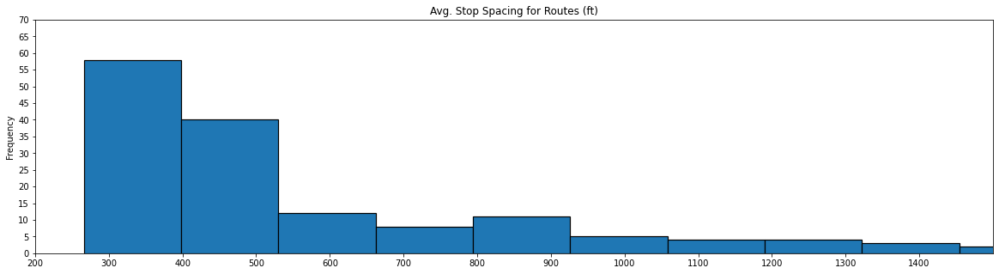

<Figure size 432x288 with 0 Axes>

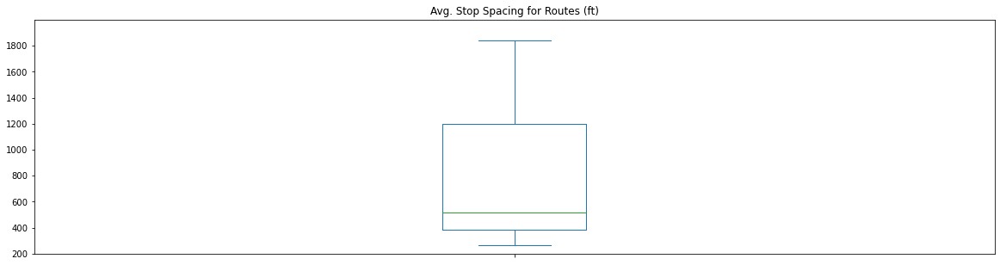

In [167]:
fig = plt.figure(figsize=[20,5])
ax = plt.subplot()
ax2 = plt.subplot()
ax = avg_rt_stp_spacing['avg_spacing'].plot.hist(xlim=[200,1500],bins=200, edgecolor='black',linewidth=1.2)
ax.set_xticks([i for i in range(200,1500,100)])
ax.set_yticks([i for i in range(0,75,5)])
ax.set_title('Avg. Stop Spacing for Routes (ft)')
plt.show()
plt.clf()
fig = plt.figure(figsize=[20,5])
ax2 = avg_rt_stp_spacing['avg_spacing'].plot.box(ylim=[200,2000], label='')
ax2.set_yticks([i for i in range(200,2000,200)])
ax2.set_title('Avg. Stop Spacing for Routes (ft)')
plt.show()

Now that we have a visual representation of the stop spacing data, let's create do a quartile analysis and present it in a table for precision.

In [168]:
bins = pd.qcut(avg_rt_stp_spacing['avg_spacing'], 4, labels=['Q1','Q2','Q3','Q4'])
bins = pd.Series(bins, name='quartile')
stop_spacing_qs = avg_rt_stp_spacing[['avg_spacing']].groupby(bins).agg(['count','min','max']).reset_index()
display(stop_spacing_qs)

quartile avg_spacing                           
                 count          min           max
0       Q1          47   265.982667    383.148421
1       Q2          46   388.841071    513.588889
2       Q3          46   514.227475   1200.730000
3       Q4          47  1200.937500  26667.880000

The values in Q4 show very large stop spacings, which is unusual. Let's examine the distributions of spacings for the routes on a map. This will involve adding the stop co-ordinates for each stop_id in the stop_times table, as well as trip_headsigns. Then, we will distill this table for unique trips by removing trips which may have different trip_ids but the same trip features (same stops, same route etc.) by using the average stop spacing as a measure of uniqueness. We will get the trip_ids with unique stop_spacings from the 'spacings' table, and filter our new table to only show these trip_ids with their associated trip headsigns.

We will then group the table by these 'unique trips' and then create a geopandas dataframe and subsequently a map with the stop co-ordinates for each trip and its associated route placed on line geometries created from the shape co-ordinates for that route. 

In [169]:
display(stop_times.head())
display(stops.head())
display(trips.head())
display(spacings.head())

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,1020,16:13:00,16:13:00,56,1,NaN,0,0,0.00,1
1,1020,16:14:38,16:14:38,1141,2,NaN,0,0,466.79,0
2,1020,16:15:23,16:15:23,1142,3,NaN,0,0,676.95,0
3,1020,16:16:15,16:16:15,1139,4,NaN,0,0,869.53,0
4,1020,16:16:57,16:16:57,1145,5,NaN,0,0,1102.58,0


,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,stop_timezone,wheelchair_boarding
0,3245,6552,Park St and McHenry St,NaN,38.891683,-77.248563,NaN,NaN,NaN,NaN,NaN,1
1,3246,6553,Lee Hwy and Eskirdge Rd (EB),NaN,38.873912,-77.231425,NaN,NaN,NaN,NaN,NaN,1
2,3247,6554,Lee Highway and Merrilee Dr,NaN,38.874153,-77.231529,NaN,NaN,NaN,NaN,NaN,1
3,3248,6555,Park St and Mchenry St,NaN,38.891647,-77.248377,NaN,NaN,NaN,NaN,NaN,1
4,3249,6556,Park St and Adahi Rd,NaN,38.893318,-77.249593,NaN,NaN,NaN,NaN,NaN,1


,trip_id,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed
0,1000020,505,2,505 Wiehle Metro,NaN,1,20502,shp-505-01,1,1
1,1002070,101,3,101 Huntington - Metro North,NaN,1,107,shp-101-01,1,1
2,1006080,101,4,101 Mt Vernon,NaN,0,808,shp-101-51,1,1
3,1008080,641,4,641 St Germain Dr - UM Church P&R,NaN,0,30508,shp-641-52,1,1
4,1011010,402,1,402 Franconia- Springfield,NaN,1,13701,shp-402-04,1,1


,trip_id,avg_spacing
0,1020,398.771702
1,2020,426.336000
2,3070,419.060405
3,4070,380.693939
4,5020,527.878125


In [170]:
stops_spatial = ((pd.merge(pd.merge(stop_times, stops[['stop_name','stop_lat','stop_lon','stop_id']], 
                on='stop_id',how='inner'),
                trips[['trip_headsign','trip_id','shape_id']], on='trip_id', how='inner'))
                .drop(['pickup_type','drop_off_type','timepoint'], axis=1))
display(stops_spatial.head())

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,shape_dist_traveled,stop_name,stop_lat,stop_lon,trip_headsign,shape_id
0,1020,16:13:00,16:13:00,56,1,NaN,0.00,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
1,1020,17:03:00,17:03:00,56,48,162 Huntington - Metro South,18742.27,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
2,1020,16:14:38,16:14:38,1141,2,NaN,466.79,North Kings Hwy and Fort Dr,38.789230,-77.076590,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
3,1020,16:15:23,16:15:23,1142,3,NaN,676.95,6000 N Kings Hwy,38.787640,-77.077520,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
4,1020,16:16:15,16:16:15,1139,4,NaN,869.53,North Kings Hwy and Fairhaven Ave,38.786070,-77.077900,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02


In [171]:
unique_trips = spacings.drop_duplicates(subset='avg_spacing')
display(unique_trips.head())

,trip_id,avg_spacing
0,1020,398.771702
1,2020,426.336000
2,3070,419.060405
3,4070,380.693939
4,5020,527.878125


In [172]:
filter = list(unique_trips['trip_id'])
stops_spatial_unique = stops_spatial[stops_spatial['trip_id'].isin(filter)].reset_index()
display(stops_spatial_unique.head())
print(len(stops_spatial_unique))
print(len(stops_spatial)) #we've removed a lot of duplicate trips from the original table

,index,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,shape_dist_traveled,stop_name,stop_lat,stop_lon,trip_headsign,shape_id
0,0,1020,16:13:00,16:13:00,56,1,NaN,0.00,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
1,1,1020,17:03:00,17:03:00,56,48,162 Huntington - Metro South,18742.27,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
2,2,1020,16:14:38,16:14:38,1141,2,NaN,466.79,North Kings Hwy and Fort Dr,38.789230,-77.076590,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
3,3,1020,16:15:23,16:15:23,1142,3,NaN,676.95,6000 N Kings Hwy,38.787640,-77.077520,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
4,4,1020,16:16:15,16:16:15,1139,4,NaN,869.53,North Kings Hwy and Fairhaven Ave,38.786070,-77.077900,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02


8080
337475


In [173]:
from shapely.geometry import LineString
import folium

Because the shapes table describes the route's curvature and path along the roads, we will have to map the shapes whose shape_ids are in the stops_spatial_unique table after creating lines from their co-ordinates, use those shapes as axes for our plot window, then plot the individual stops and their respective stop-co-ordinates.

In [174]:
shapes_2plt = shapes[shapes['shape_id'].isin(stops_spatial_unique['shape_id'])].reset_index().drop(['index'], axis=1)
shapes_2plt.index.name='index'
display(shapes_2plt)
print(len(shapes))

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
index,,,,,
0,shp-101-01,38.711250,-77.087230,1,0.00
1,shp-101-01,38.711290,-77.087200,2,5.15
2,shp-101-01,38.711260,-77.087130,3,12.08
3,shp-101-01,38.711210,-77.087010,4,23.88
4,shp-101-01,38.711150,-77.086930,5,33.51
...,...,...,...,...,...
342168,shp-RIBS5-03,38.956845,-77.359972,1081,15155.63
342169,shp-RIBS5-03,38.956889,-77.359910,1082,15162.89
342170,shp-RIBS5-03,38.956907,-77.359688,1083,15182.23


345297


In [175]:
shapes = gpd.GeoDataFrame(
    shapes_2plt, geometry=gpd.points_from_xy(shapes_2plt['shape_pt_lon'], shapes_2plt['shape_pt_lat']))
display(shapes.head())

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled,geometry
index,,,,,,
0,shp-101-01,38.71125,-77.08723,1,0.00,POINT (-77.08723 38.71125)
1,shp-101-01,38.71129,-77.08720,2,5.15,POINT (-77.08720 38.71129)
2,shp-101-01,38.71126,-77.08713,3,12.08,POINT (-77.08713 38.71126)
3,shp-101-01,38.71121,-77.08701,4,23.88,POINT (-77.08701 38.71121)
4,shp-101-01,38.71115,-77.08693,5,33.51,POINT (-77.08693 38.71115)


In [176]:
line_gdf = shapes.sort_values(by=['shape_pt_sequence']).groupby(['shape_id'])['geometry'].apply(lambda x: LineString(x.tolist()))
line_gdf = gpd.GeoDataFrame(line_gdf, geometry='geometry').reset_index()
line_gdf = line_gdf.set_crs("EPSG:4326")
line_gdf2 = pd.merge(line_gdf, stops_spatial_unique[['trip_headsign','shape_id']], on='shape_id')
display(line_gdf2.head())

,shape_id,geometry,trip_headsign
0,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
1,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
2,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
3,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
4,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North


Now, we have routes and their associated paths in line_gdf2. We will only plot the routes and stops for trips (using trip_ids) for the top ten trips with the highest average stop spacing.

In [177]:
display(stops_spatial_unique.head())

,index,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,shape_dist_traveled,stop_name,stop_lat,stop_lon,trip_headsign,shape_id
0,0,1020,16:13:00,16:13:00,56,1,NaN,0.00,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
1,1,1020,17:03:00,17:03:00,56,48,162 Huntington - Metro South,18742.27,Huntington Metro,38.792776,-77.076203,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
2,2,1020,16:14:38,16:14:38,1141,2,NaN,466.79,North Kings Hwy and Fort Dr,38.789230,-77.076590,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
3,3,1020,16:15:23,16:15:23,1142,3,NaN,676.95,6000 N Kings Hwy,38.787640,-77.077520,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02
4,4,1020,16:16:15,16:16:15,1139,4,NaN,869.53,North Kings Hwy and Fairhaven Ave,38.786070,-77.077900,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,shp-162-02


In [178]:
topspacing = unique_trips.sort_values(by='avg_spacing',ascending=False)[:50].reset_index().drop('index',axis=1)
topspacing.index.name='index'
display(topspacing.head())
filter = list(topspacing['trip_id'])
topstops = stops_spatial_unique[stops_spatial_unique['trip_id'].isin(filter)]
topstops = gpd.GeoDataFrame(topstops, geometry= gpd.points_from_xy(topstops['stop_lon'],topstops['stop_lat'])).set_crs("EPSG:4326")
display(topstops.head())
print(len(topstops))

,trip_id,avg_spacing
index,,
0,8148020,34065.70
1,3005020,26667.88
2,511020,26109.22
3,424020,22661.96
4,49020,22285.48


,index,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,shape_dist_traveled,stop_name,stop_lat,stop_lon,trip_headsign,shape_id,geometry
3055,135625,599020,11:45:00,11:45:00,2957,9,NaN,12060.59,Franconia-Springfield Metro,38.767081,-77.167578,494 Tysons - Spring Hill Metro,shp-494-02,POINT (-77.16758 38.76708)
3056,135626,599020,11:31:00,11:31:00,1364,5,NaN,3622.59,Saratoga Shopping Ctr,38.740080,-77.211520,494 Tysons - Spring Hill Metro,shp-494-02,POINT (-77.21152 38.74008)
3057,135627,599020,11:48:27,11:48:27,356,12,NaN,14330.61,Commerce St and Bowie Dr,38.780470,-77.177250,494 Tysons - Spring Hill Metro,shp-494-02,POINT (-77.17725 38.78047)
3058,135628,599020,12:17:54,12:17:54,1408,23,NaN,35991.72,Spring Hill Rd and Post Office,38.928930,-77.237710,494 Tysons - Spring Hill Metro,shp-494-02,POINT (-77.23771 38.92893)
3059,135629,599020,12:10:00,12:10:00,2139,13,NaN,33077.71,Galleria Dr and Tysons Blvd,38.922465,-77.220517,494 Tysons - Spring Hill Metro,shp-494-02,POINT (-77.22052 38.92247)


295


Now, we have stops for the top 50 unique trips and can plot these along with their associated line geometries.

In [179]:
filter = topstops['shape_id'].unique()
top_lines = line_gdf2[line_gdf2['shape_id'].isin(filter)]
display(top_lines.head())

,shape_id,geometry,trip_headsign
2595,shp-340-01,"LINESTRING (-77.19594 38.75555, -77.19589 38.7...",340 Franconia-Springfield
2596,shp-340-01,"LINESTRING (-77.19594 38.75555, -77.19589 38.7...",340 Franconia-Springfield
2597,shp-340-01,"LINESTRING (-77.19594 38.75555, -77.19589 38.7...",340 Franconia-Springfield
2598,shp-340-01,"LINESTRING (-77.19594 38.75555, -77.19589 38.7...",340 Franconia-Springfield
2599,shp-340-51,"LINESTRING (-77.16785 38.76698, -77.16762 38.7...",340 Patriot Ridge


In [422]:
m = top_lines.explore(column="trip_headsign",name='Routes', tiles='cartodbpositron', legend=False)
topstops.explore(m=m,column='trip_headsign',name='Stops', legend=False)
folium.LayerControl().add_to(m)  # use folium to add layer control
print('Top 50 Routes with The Highest Average Stop Spacing')
m  # show map

Top 50 Routes with The Highest Average Stop Spacing


The visualization has clarified what's going on, it seems the stops are not widely spaced, but rather, clustered in specific route service areas, such as residential/industrial zones. As a result, these routes may be BRT or Express Lines. Click on the layers icon to toggle the layers on and off and better see the stop clustering.

# Analysis 2 - Service Frequency and Span
For this next analysis, we'll examine frequency and span metrics for each individual stop, assuming that from a service standpoint, transit users will have particular stops that are close to their place of residence or work which they use regularly. Analyzing the frequency of individual routes at each stop will allow us to get an idea of frequency at a granular level. The same goes for span. The strategy for this is to classify a unique trip based on the trip_headsign value, then group these unique trips for each stop_id. We will further group each unique trip based on its service_id, as whether a service is on a weekday or weekend naturally would have a significant impact on frequency.

First we convert the arrival_time and departure_time columns to timedelta objects which can be used to calculate span and frequency. As these columns only had times of day, we can disregard the date values, which don't affect this calculation. Dates are implicit in the 'calendar' table and taken generally as weekday or weekend.

In [185]:
stop_times2 = stop_times.copy()
stop_times2['arrival_time'] = pd.to_timedelta(stop_times2['arrival_time'])
stop_times2['departure_time'] = pd.to_timedelta(stop_times2['departure_time'])
display(stop_times2.head())

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,1020,0 days 16:13:00,0 days 16:13:00,56,1,NaN,0,0,0.00,1
1,1020,0 days 16:14:38,0 days 16:14:38,1141,2,NaN,0,0,466.79,0
2,1020,0 days 16:15:23,0 days 16:15:23,1142,3,NaN,0,0,676.95,0
3,1020,0 days 16:16:15,0 days 16:16:15,1139,4,NaN,0,0,869.53,0
4,1020,0 days 16:16:57,0 days 16:16:57,1145,5,NaN,0,0,1102.58,0


In [186]:
display(trips.head())
display(calendar.head())

,trip_id,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed
0,1000020,505,2,505 Wiehle Metro,NaN,1,20502,shp-505-01,1,1
1,1002070,101,3,101 Huntington - Metro North,NaN,1,107,shp-101-01,1,1
2,1006080,101,4,101 Mt Vernon,NaN,0,808,shp-101-51,1,1
3,1008080,641,4,641 St Germain Dr - UM Church P&R,NaN,0,30508,shp-641-52,1,1
4,1011010,402,1,402 Franconia- Springfield,NaN,1,13701,shp-402-04,1,1


,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,1,0,0,0,0,0,0,1,20210710,20220731
1,2,1,1,1,1,1,0,0,20210710,20220731
2,3,0,0,0,0,0,1,0,20210710,20220731
3,4,0,0,0,0,0,0,0,20210710,20220731


We merge the table with timedeltas with the columns for trip_headsign and service_id based on the trip_id relation.

In [188]:
freq_table = pd.merge(stop_times2, trips[['trip_id','trip_headsign','service_id']], on='trip_id')

In [190]:
display(freq_table.head())

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint,trip_headsign,service_id
0,1020,0 days 16:13:00,0 days 16:13:00,56,1,NaN,0,0,0.00,1,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,2
1,1020,0 days 16:14:38,0 days 16:14:38,1141,2,NaN,0,0,466.79,0,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,2
2,1020,0 days 16:15:23,0 days 16:15:23,1142,3,NaN,0,0,676.95,0,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,2
3,1020,0 days 16:16:15,0 days 16:16:15,1139,4,NaN,0,0,869.53,0,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,2
4,1020,0 days 16:16:57,0 days 16:16:57,1145,5,NaN,0,0,1102.58,0,162 Hybla Valley - Mt Vernon Hosp - Arlington Dr,2


337475 337475


Before we execute the groupby, we define aggregate functions that will give us the span and frequency for each unique route at each stop (differentiated by stop_id). The first aggregate function, 'pk_to_pk', gives the span by getting the time difference between the minimum time for a unique route and the maximum time. the 'freq' function will get that same difference and divide it by the count of arrivals at each stop minus 1, which will give us the headway or frequency between each arrival as opposed to how many arrivals there are (a helpful analogy is that the number of spaces between say, three fenceposts is the number of fenceposts minus one, or two).

In [210]:
def pk_to_pk(x):
    return x.max() - x.min()
def freq(x):
    return (x.max() - x.min())/(x.count()-1) if x.count() > 1 else (x.max() - x.min())/(x.count())
grouped_freq = freq_table.groupby(['stop_id','trip_headsign','service_id'])['arrival_time'].agg([('span', pk_to_pk), ('freq.', freq)])

We execute the groupby operation to get our desired table, formatting the span and freq. columns to get their values in hours for span, and minutes for frequency.

In [212]:
grouped_freq_asrows = grouped_freq.reset_index()
grouped_freq_asrows['span'] = grouped_freq_asrows['span']/np.timedelta64(1,'h')
grouped_freq_asrows['freq.'] = grouped_freq_asrows['freq.']/np.timedelta64(1,'m')
display(grouped_freq_asrows.head())

,stop_id,trip_headsign,service_id,span,freq.
0,2,171 Lorton V.R.E.,1,18.192500,30.320833
1,2,171 Lorton V.R.E.,2,21.204167,25.445000
2,2,171 Lorton V.R.E.,3,20.199167,31.075641
3,2,171 Lorton V.R.E.,4,21.204167,25.445000
4,3,151 Woodlawn via Sacramento,1,17.000000,39.230769


Now, we would like to explore this frequency and span data for its distributions. Let's start with distributions grouped by service_id for span and frequency. Boxplots and KDE plots are a good way to get a feel for this.

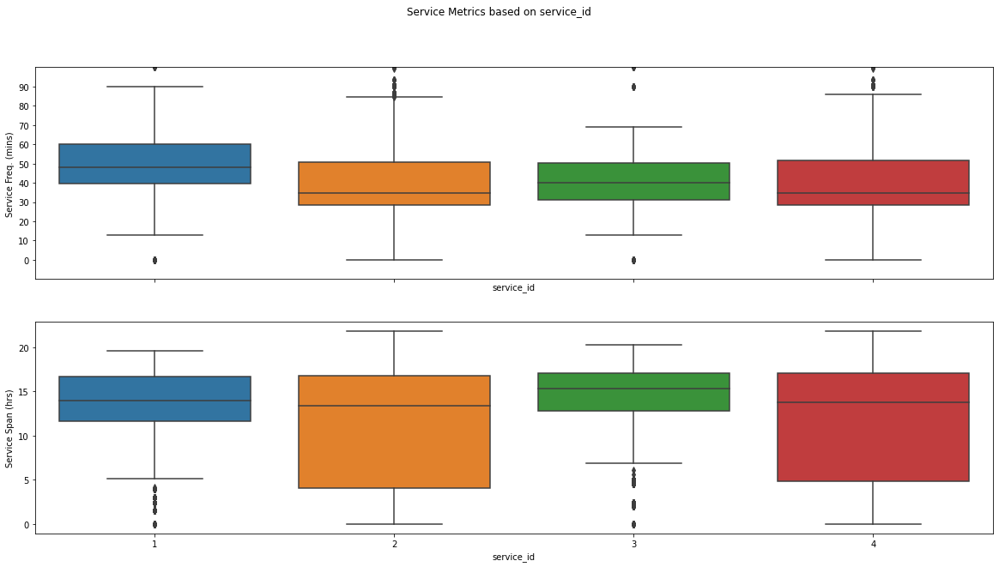

In [293]:
fig, axs = plt.subplots(2,figsize=[20,10],sharex=True)
sns.boxplot(x='service_id', y='freq.', data=grouped_freq_asrows, ax=axs[0])
sns.boxplot(x='service_id', y='span', data=grouped_freq_asrows, ax=axs[1])
axs[0].set_ylim([-10,100])
axs[0].set_yticks([i for i in range(0,100,10)])
axs[0].set_ylabel('Service Freq. (mins)')
axs[1].set_ylabel('Service Span (hrs)')
plt.suptitle('Service Metrics based on service_id')
plt.show()

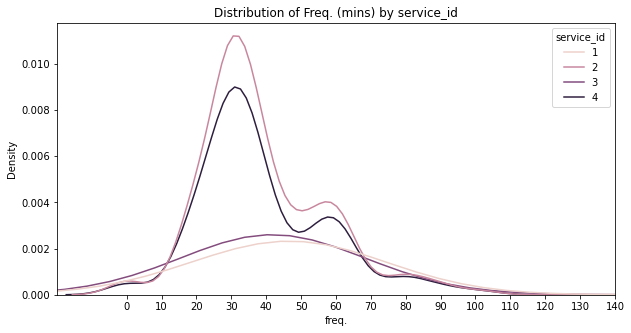

<Figure size 432x288 with 0 Axes>

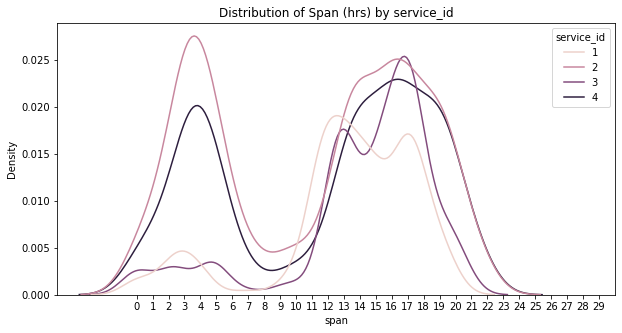

In [392]:
sns.set_palette("Set2")
fig = plt.figure(figsize=[10,5])
ax = plt.subplot()
sns.kdeplot(x=grouped_freq_asrows['freq.'], hue='service_id', data=grouped_freq_asrows)
ax.set_xlim(-20,130)
ax.set_xticks([i for i in range(0,150,10)])
ax.set_title('Distribution of Freq. (mins) by service_id')
plt.show()
plt.clf()
fig = plt.figure(figsize=[10,5])
ax = plt.subplot()
sns.kdeplot(x=grouped_freq_asrows['span'], hue='service_id', data=grouped_freq_asrows)
ax.set_xlim(-5,30)
ax.set_xticks([i for i in range(0,30,1)])
plt.title('Distribution of Span (hrs) by service_id')
plt.show()

The KDEs have some good insights. For frequency, it looks like the weekday service, service_id = 2 and service_id = 4, which we have not explored thus far and has no occurences on any day of the week in the calendar table have, better frequencies than the weekend service lines (service_id = 1 and 3). This can be expected. The span, also shows an interesting trend, again involving service_ids 2 and 4, which is that some routes have spans of 3 to 4 hours. These could be the peak hour weekday service lines going in one direction.

Let's investigate service_id 4 to see what kind of routes belong to it.

In [420]:
display(grouped_freq_asrows[grouped_freq_asrows['service_id']==4].head(5))
print('Unique Routes with service_id  of 4: ',
      len(grouped_freq_asrows['trip_headsign'][grouped_freq_asrows['service_id']==4].unique()))

,stop_id,trip_headsign,service_id,span,freq.
3,2,171 Lorton V.R.E.,4,21.204167,25.445000
7,3,151 Woodlawn via Sacramento,4,17.500000,29.166667
9,3,159 Engleside - Limited-Stop,4,5.183333,22.214286
13,3,171 Lorton V.R.E.,4,21.250000,25.500000
17,4,151 Woodlawn via Sacramento,4,17.503056,29.171759


Unique Routes with service_id  of 4:  136


A cursory look at the values with service_id 4 does not tell us much. Maybe visualizing these routes can give a better clue as to their nature. Seeing as we have 136 unique routes, we will also have many thousands of lines to plot for them. This will take up a lot of CPU without a GIS software. As a compromise we will randomly sample 15 of the service_id 4 unique routes and try to analyze what they have in common.

Before we do that, let's switch gears and explore the relationship between frequency and location of stops. We will first categorize our frequencies into bins based on the following table (Source: Performance Measures and Level of Transit Service Assessment of Public Transport Bus Network in Baghdad City during 2002-2003 - Scientific Figure on ResearchGate. Available from: https://www.researchgate.net/figure/Values-of-service-frequency-level-of-transit-service-for-urban-scheduled-bus-service-15_tbl4_355038565 [accessed 18 Feb, 2022])

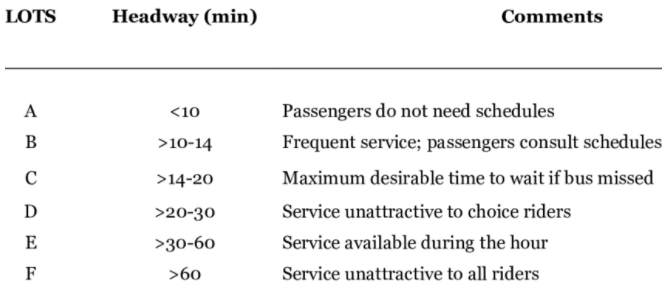

For ease of plotting, let's get the average LOTS for each stop so we don't have multiple points on top of each other in our map.

In [437]:
grouped_stop_avgs = grouped_freq_asrows.groupby(['stop_id'])['freq.'].mean().reset_index()
freqbins = pd.cut(grouped_stop_avgs['freq.'], [0,10,14,20,30,60,2000], labels=['A','B','C','D','E','F'], include_lowest=True)
grouped_stop_avgs['LOTS'] = freqbins
display(grouped_stop_avgs.head())

,stop_id,freq.,LOTS
0,2,28.071619,D
1,3,29.376618,D
2,4,37.328978,E
3,5,31.178570,E
4,6,29.363444,D


Let's then append the stop co-ordinates to this table, create a geodataframe from it, then plot the points onto a map.

In [440]:
LOTS_spatial = pd.merge(grouped_stop_avgs, stops[['stop_id','stop_lat','stop_lon']], on='stop_id')
LOTS_spatial = gpd.GeoDataFrame(LOTS_spatial, geometry= gpd.points_from_xy(LOTS_spatial['stop_lon'],LOTS_spatial['stop_lat'])).set_crs("EPSG:4326")
display(LOTS_spatial.head())

,stop_id,freq.,LOTS,stop_lat,stop_lon,geometry
0,2,28.071619,D,38.708875,-77.160438,POINT (-77.16044 38.70887)
1,3,29.376618,D,38.773520,-77.081300,POINT (-77.08130 38.77352)
2,4,37.328978,E,38.766970,-77.083650,POINT (-77.08365 38.76697)
3,5,31.178570,E,38.749140,-77.083220,POINT (-77.08322 38.74914)
4,6,29.363444,D,38.758494,-77.083956,POINT (-77.08396 38.75849)


In [454]:
m2 = LOTS_spatial.explore(column='LOTS',name='Stops',tiles='cartodbpositron', legend=True, cmap="Set1")
folium.LayerControl().add_to(m2)  # use folium to add layer control
print('Stop LOTS')
m2

Stop LOTS


First, we filter our line geodataframe for the service_id 4 routes.

In [425]:
filter = grouped_freq_asrows['trip_headsign'][grouped_freq_asrows['service_id']==4].unique()
service4_lines = line_gdf2[line_gdf2['trip_headsign'].isin(filter)]
display(service4_lines.head())

,shape_id,geometry,trip_headsign
0,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
1,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
2,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
3,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North
4,shp-101-01,"LINESTRING (-77.08723 38.71125, -77.08720 38.7...",101 Huntington - Metro North


# Analysis 3 - Connectivity of Stops with Multi-Modal Infrastructure